### Regresión Lineal con Machine Learning

En esta práctica se entrenará un modelo de regresión lineal para predecir la tarifa de un viaje en taxi.

--Esta práctica esta basada en el ejercicio de programación de Regresión Lineal que es parte del curso de google: Machine learning crash course (https://developers.google.com/machine-learning/crash-course/linear-regression/programming-exercise).

Su desarrollo requiere de comprensión y conocimiento más profundo, pero para este ejercicio utilizaremos los recursos como cajas negras.--

### Información del dataset
El dataset utilizado se obtuvo de Kaggle: https://www.kaggle.com/datasets/adelanseur/taxi-trips-chicago-2024/data?select=Taxi_Trips_-_2024_20240408.csv



# Importar las dependencias

Para este caso utilizaremos keras para crear el modelo (machine learning).

Por otra parte, para la visualización se utilizará plotly para agregar interactividad.

In [109]:
# data
import numpy as np
import pandas as pd

# machine learning
from tensorflow import keras

# data visualization
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

# Cargar los datos

En esta practica se utilizarán features seleccionadas arbitrariamente.

-En otras prácticas se realizaron análisis estadísticos para profundizar en la selección de variables independientes para un modelo-

Para el entrenamiento y pruebas, se dividió el dataset completo en dos (2) partes.

El primer dataset será utilizado para entrenar el modelo, mientras que el segundo se utilizará para testear las predicciones del modelo.

In [113]:
taxi_dataset = pd.read_csv("./Taxi_Trips.csv")
taxi_dataset = taxi_dataset.loc[:, ('Trip Miles','Trip Seconds', 'Fare')].dropna()

# print(taxi_dataset.columns)
print("Numero de registros del dataset: {0}".format(len(taxi_dataset)))

# se toma un 80% del dataset para el entrenamiento
training_df = taxi_dataset.sample(frac=0.8, random_state=0)

# el resto (20%) sera utilizado en el testeo
test_df = taxi_dataset.drop(training_df.index)

print("Numero de registros del dataset de entrenamiento: {0}".format(len(training_df)))
print("Numero de registros del dataset de testeo: {0}".format(len(test_df)))


Numero de registros del dataset: 863104
Numero de registros del dataset de entrenamiento: 690483
Numero de registros del dataset de testeo: 172621


In [114]:
print(training_df.describe())
print()
print(training_df.corr())
print()
px.scatter_matrix(training_df, dimensions=['Trip Miles','Trip Seconds', 'Fare'])

          Trip Miles   Trip Seconds           Fare
count  690483.000000  690483.000000  690483.000000
mean        6.561435    1150.008882      22.024836
std         8.319812    1572.673840      23.135182
min         0.000000       0.000000       0.000000
25%         0.910000     459.000000       8.000000
50%         3.070000     900.000000      15.750000
75%        11.710000    1591.000000      33.750000
max      3093.470000   86340.000000    9999.750000

              Trip Miles  Trip Seconds      Fare
Trip Miles      1.000000      0.363504  0.811614
Trip Seconds    0.363504      1.000000  0.338808
Fare            0.811614      0.338808  1.000000



# Creación del modelo

In [115]:
def create_model(
    settings: dict, # diccionario con las configuraciones del modelo
    metrics: list[keras.metrics.Metric] # metricas (rmse)
    ) -> keras.Model:
  # creamos un diccionario en el cual por cada feature se crea un tensor de 1 dimension
  # el diccionario se crea empleando "dictionary comprehension"
  inputs = {name: keras.Input(shape=(1,), name=name) for name in settings["input_features"]}

  # se utiliza para concatenar varias features y obtener un unico tensor
  concatenated_inputs = keras.layers.Concatenate()(list(inputs.values()))

  # se crea una capa densa para construir una red neuronal
  outputs = keras.layers.Dense(units=1)(concatenated_inputs)

  # se utiliza la API funcional de keras para crear el modelo de red neuronal
  model = keras.Model(inputs=inputs, outputs=outputs)

  # se compila el modelo para el entrenamiento
  model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=settings["learning_rate"]),
                loss="mean_squared_error",
                metrics=metrics)
  return model

def train_model(experiment_name: str,
                model: keras.Model,
                dataset: pd.DataFrame,
                label_name: str,
                settings: dict
                ):
  features = {name: dataset[name].values for name in settings["input_features"]}
  label = dataset[label_name].values

  # se ejecuta el metodo .fit para entrenar el modelo y hallar los parametros internos
  history = model.fit(x=features,
                      y=label,
                      batch_size=settings["batch_size"],
                      epochs=settings["number_epochs"])

  # se retorna un diccionaria con el modelo entrenado y demas detalles
  return {
        "name": experiment_name,
        "model": model,
        "epochs": history.epoch,
        "metrics_history": pd.DataFrame(history.history),
        "settings": settings
  }

# Creación de funciones de visualización

## Gráfico de la curva de error para determinar la convergencia

In [116]:
def plot_experiment_metrics(experiment: dict, metrics: list[str]):
    history_df = experiment["metrics_history"]

    plt.figure(figsize=(10, 6))
    plt.plot(history_df[metrics[0]], label=f"{metrics[0]} final: {history_df[metrics[0]].iloc[-1]:.4f}")

    plt.xlabel("Epochs")
    plt.ylabel("Metric value")
    plt.title(f"Métricas de entrenamiento: {experiment['name']}")
    plt.legend()
    plt.grid(True, linewidth=2)
    plt.show()

## Gráfico predicciones vs valores del datset

In [117]:
def plot_model_predictions(experiment: dict, dataset: pd.DataFrame, label_name: str):
    model = experiment["model"]
    input_feature = experiment["settings"]["input_features"][0]

    x = dataset[input_feature].values
    y = dataset[label_name].values


    features = {input_feature: x}
    y_pred = model.predict(features).flatten()


    df = pd.DataFrame({
        input_feature: x,
        label_name: y,
        "Predicción": y_pred
    })

    fig = px.scatter(
        df, x=input_feature, y=label_name,
        opacity=0.6,
        title=f"{input_feature} vs {label_name}",
        labels={input_feature: input_feature, label_name: label_name}
    )

    # Ordenar por feature para línea continua de predicción
    df_sorted = df.sort_values(by=input_feature)
    fig.add_trace(
        go.Scatter(
            x=df_sorted[input_feature],
            y=df_sorted["Predicción"],
            mode='lines',
            name='Predicción del modelo',
            line=dict(color='red')
        )
    )

    fig.update_layout(height=600, width=800)
    fig.show()


# Configuración del entrenamiento
En esta sección añadiremos los parámetros para entrenar el modelo.

Para mostrar distintos resultados, se haran varios modelos y experimentos

In [118]:
settings_1 = {
    "learning_rate": 0.001,
    "number_epochs": 20,
    "batch_size": 500,
    "input_features": ['Trip Miles']
}

settings_2 = {
    "learning_rate": 0.01,
    "number_epochs": 50,
    "batch_size": 1000,
    "input_features": ['Trip Miles']
}

settings_3 = {
    "learning_rate": 0.001,
    "number_epochs": 50,
    "batch_size": 500,
    "input_features": ['Trip Seconds']
}

settings_4 = {
    "learning_rate": 0.001,
    "number_epochs": 50,
    "batch_size": 500,
    "input_features": ['Trip Seconds', 'Trip Miles']
}

# Entrenamiento de los modelos


## Entrenamiento y modelo 1

In [119]:
metrics = [keras.metrics.RootMeanSquaredError(name='rmse')]

model_1 = create_model(settings=settings_1, metrics=metrics)

experiment_1 = train_model(experiment_name='one_feature', model=model_1, dataset=training_df, label_name='Fare', settings=settings_1)


Epoch 1/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 1151.6057 - rmse: 33.9265
Epoch 2/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 468.0332 - rmse: 21.6144
Epoch 3/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 194.1504 - rmse: 13.9297
Epoch 4/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 151.1958 - rmse: 12.2556
Epoch 5/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 170.0356 - rmse: 13.0018
Epoch 6/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 154.6270 - rmse: 12.3633
Epoch 7/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 165.2764 - rmse: 12.8351
Epoch 8/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 186.6341 - rmse: 13.5883
Epoch 9/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 288.5705 - rmse: 15.9413
Epoch 10/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 167.7744 - rmse: 12.9253
Epoch 11/20
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 233.2307 - rmse: 14.9563
Epoch 12/20
1381/1381 ━━━━━━━━━━━━━━━━━━

## Entrenamiento y modelo 2

In [120]:
metrics = [keras.metrics.RootMeanSquaredError(name='rmse')]

model_2 = create_model(settings=settings_2, metrics=metrics)

experiment_2 = train_model(experiment_name='one_feature', model=model_2, dataset=training_df, label_name='Fare', settings=settings_2)


Epoch 1/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 980.7746 - rmse: 30.7640
Epoch 2/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 189.1954 - rmse: 13.7132
Epoch 3/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 191.4910 - rmse: 13.7263
Epoch 4/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 169.7169 - rmse: 12.9829
Epoch 5/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 173.5272 - rmse: 13.0906
Epoch 6/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 189.2602 - rmse: 13.6685
Epoch 7/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 174.1128 - rmse: 13.1518
Epoch 8/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 170.3639 - rmse: 12.9806
Epoch 9/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 158.6513 - rmse: 12.5704
Epoch 10/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 164.2297 - rmse: 12.7790
Epoch 11/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 164.8687 - rmse: 12.7844
Epoch 12/50
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 17

## Entrenamiento y modelo 3

In [121]:
metrics = [keras.metrics.RootMeanSquaredError(name='rmse')]

model_3 = create_model(settings=settings_3, metrics=metrics)

experiment_3 = train_model(experiment_name='one_feature', model=model_3, dataset=training_df, label_name='Fare', settings=settings_3)

Epoch 1/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 3364155.2500 - rmse: 1818.6569
Epoch 2/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 24155.3184 - rmse: 143.1026
Epoch 3/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 457.5154 - rmse: 21.3147
Epoch 4/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 658.4664 - rmse: 25.4200
Epoch 5/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 518.2361 - rmse: 22.5806
Epoch 6/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 585.9377 - rmse: 24.0028
Epoch 7/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 497.2024 - rmse: 22.0887
Epoch 8/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 644.2148 - rmse: 25.2047
Epoch 9/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 469.6643 - rmse: 21.5707
Epoch 10/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 685.5853 - rmse: 25.5936
Epoch 11/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 466.8023 - rmse: 21.3501
Epoch 12/50
1381/1381 ━━━━━━━━━━

## Entrenamiento y modelo 4

In [122]:
metrics = [keras.metrics.RootMeanSquaredError(name='rmse')]

model_4 = create_model(settings=settings_4, metrics=metrics)

experiment_4 = train_model(experiment_name='two_feature', model=model_4, dataset=training_df, label_name='Fare', settings=settings_4)

Epoch 1/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 5226459.5000 - rmse: 2261.3645
Epoch 2/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 170458.8281 - rmse: 394.3716
Epoch 3/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 1298.2698 - rmse: 35.8054
Epoch 4/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 499.3279 - rmse: 22.3035
Epoch 5/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 339.0496 - rmse: 18.2386
Epoch 6/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 188.2583 - rmse: 13.7106
Epoch 7/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 165.0045 - rmse: 12.8176
Epoch 8/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 183.2501 - rmse: 13.4744
Epoch 9/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 156.2819 - rmse: 12.4390
Epoch 10/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 214.5786 - rmse: 14.5927
Epoch 11/50
1381/1381 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 168.5943 - rmse: 12.9070
Epoch 12/50
1381/1381 ━━━━━━━━

# Visualización de los resultados

## Modelo 1

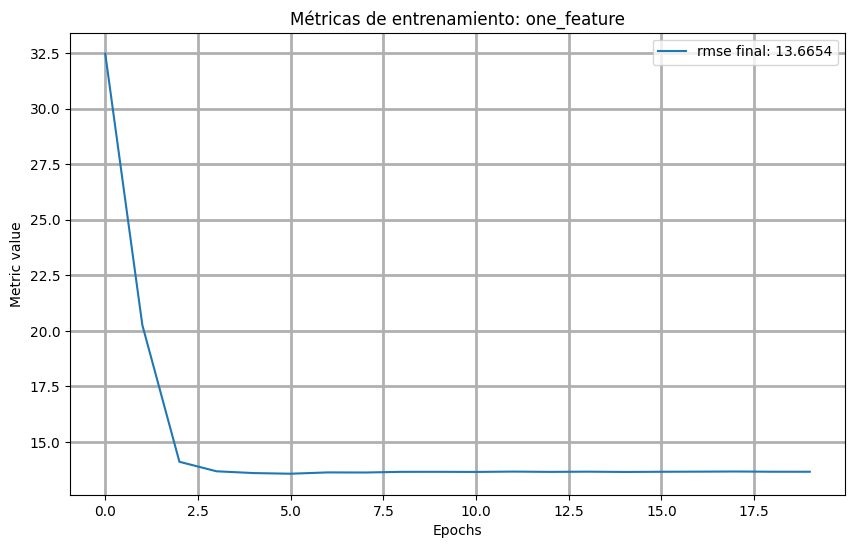

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [123]:
plot_experiment_metrics(experiment_1, ['rmse'])
plot_model_predictions(experiment_1, training_df.sample(n=2000, random_state=42), label_name='Fare')


## Modelo 2

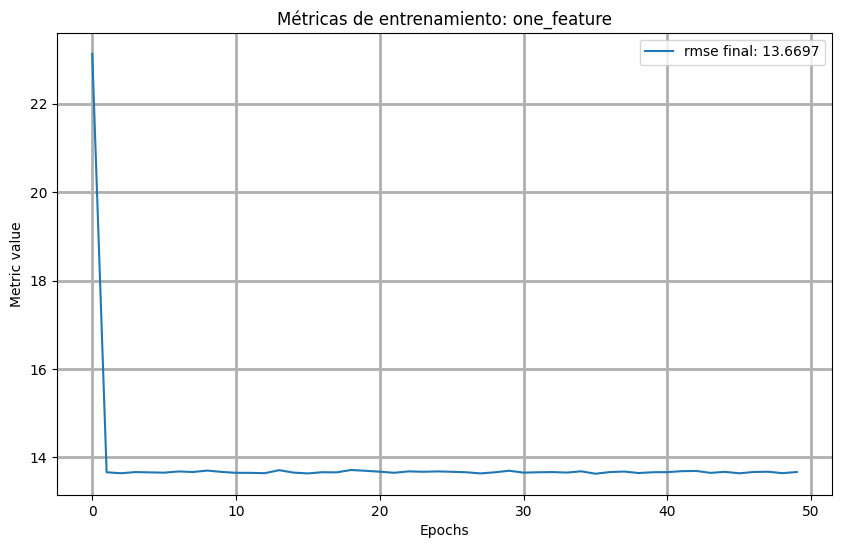

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [124]:
plot_experiment_metrics(experiment_2, ['rmse'])
plot_model_predictions(experiment_2, training_df.sample(n=2000, random_state=42), label_name='Fare')

## Modelo 3

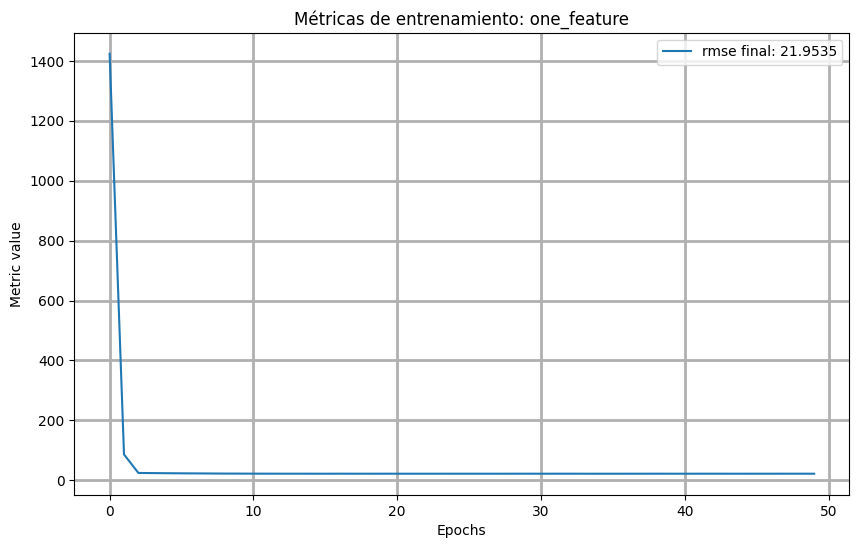

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [125]:
plot_experiment_metrics(experiment_3, ['rmse'])
plot_model_predictions(experiment_3, training_df.sample(n=2000, random_state=42), label_name='Fare')

## Modelo 4

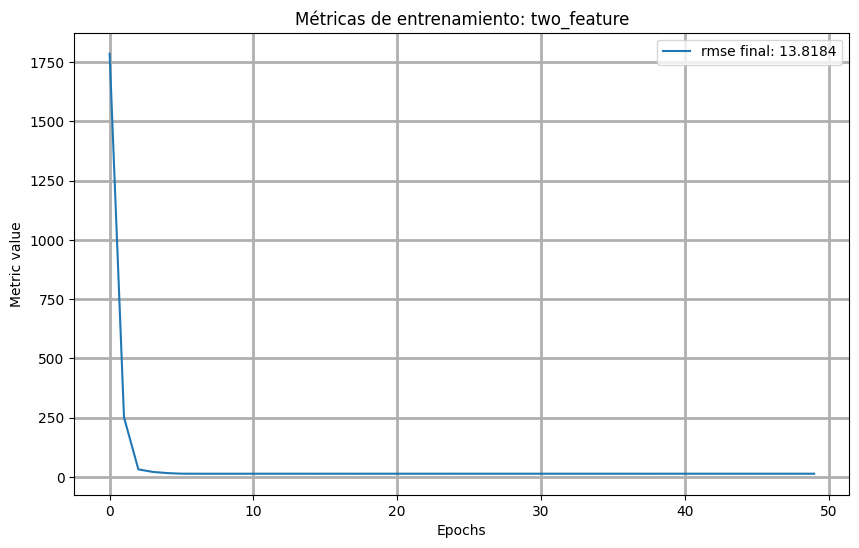

In [127]:
plot_experiment_metrics(experiment_4, ['rmse'])

# Evaluación de las predicciones del modelo

--Función extraida el ejemplo práctico del curso--

In [128]:
def format_currency(x):
  return "${:.2f}".format(x)

def build_batch(df, batch_size):
  batch = df.sample(n=batch_size).copy()
  batch.set_index(np.arange(batch_size), inplace=True)
  return batch

def predict_fare(model, df, features, label, batch_size=50):
  batch = build_batch(df, batch_size)
  predicted_values = model.predict_on_batch(x={name: batch[name].values for name in features})

  data = {
      "PREDICTED_FARE": [],
      "OBSERVED_FARE": [],
      "L1_LOSS": [],
      **{name: [] for name in features}
      }

  for i in range(batch_size):
    predicted = predicted_values[i][0]
    observed = batch.at[i, label]
    data["PREDICTED_FARE"].append(format_currency(predicted))
    data["OBSERVED_FARE"].append(format_currency(observed))
    data["L1_LOSS"].append(format_currency(abs(observed - predicted)))

    for feat in features:
      data[feat].append("{:.2f}".format(batch.at[i, feat]))

  output_df = pd.DataFrame(data)
  return output_df

def show_predictions(output):
  header = "-" * 80
  banner = header + "\n" + "|" + "PREDICTIONS".center(78) + "|" + "\n" + header
  print(banner)
  print(output)
  return

In [130]:
output = predict_fare(experiment_4["model"], test_df, experiment_4["settings"]["input_features"], 'Fare')
show_predictions(output)

--------------------------------------------------------------------------------
|                                 PREDICTIONS                                  |
--------------------------------------------------------------------------------
   PREDICTED_FARE OBSERVED_FARE L1_LOSS Trip Seconds Trip Miles
0           $8.16         $8.75   $0.59       720.00       0.10
1          $12.44        $10.64   $1.80      1105.00       2.38
2          $36.34        $38.50   $2.16      1803.00      15.08
3           $7.99         $3.25   $4.74        29.00       0.00
4          $28.81        $29.00   $0.19       980.00      11.07
5          $42.01        $45.50   $3.49      2313.00      18.10
6          $36.61        $38.25   $1.64      1544.00      15.22
7          $35.19        $39.00   $3.81      3476.00      14.50
8          $42.86        $45.25   $2.39      1486.00      18.54
9           $9.05        $31.00  $21.95      2100.00       0.60
10         $10.80         $7.75   $3.05       540.00 

# Notas

Es importante resaltar que esto es un ejercicio de prueba y experimentación, muchos conceptos, técnicas y demás aspectos, deben ser profundizados para garantizar su correcta aplicación.

El ejercicio práctico de google mlcc tenia el objetivo de dar un preview de varios conceptos vistos hasta el módulo de Rregresión Lineal, sin  profundizar en el funcionamiento interno de los bibliotecas o pasos concretos para llevar a cabo un análisis exhaustivo del modelo.

--Si eres un usuario que ha encontrado este recurso sin tener un conocimiento previo, te recomiendo ir al curso asociado y/o consultar la documentacion de las bibliotecas utilizadas.--